In [1]:
import pandas as pd
import numpy as np
from sklearn import metrics
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [2]:
airq = pd.read_excel('AirQualityUCI.xlsx')# reading the excel file

In [3]:
airq.shape # shows no of rows and columns

(9357, 15)

In [4]:
airq.head() #shows top five rows

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.60,48.875001,0.757754
1,2004-03-10,19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.30,47.700000,0.725487
2,2004-03-10,20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.90,53.975000,0.750239
3,2004-03-10,21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.00,60.000000,0.786713
4,2004-03-10,22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.15,59.575001,0.788794


In [5]:
airq.tail() # shows bottom five rows

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
9352,2005-04-04,10:00:00,3.1,1314.25,-200,13.529605,1101.25,471.7,538.50,189.8,1374.25,1728.50,21.850,29.250,0.756824
9353,2005-04-04,11:00:00,2.4,1162.50,-200,11.355157,1027.00,353.3,603.75,179.2,1263.50,1269.00,24.325,23.725,0.711864
9354,2005-04-04,12:00:00,2.4,1142.00,-200,12.374538,1062.50,293.0,603.25,174.7,1240.75,1092.00,26.900,18.350,0.640649
9355,2005-04-04,13:00:00,2.1,1002.50,-200,9.547187,960.50,234.5,701.50,155.7,1041.00,769.75,28.325,13.550,0.513866
9356,2005-04-04,14:00:00,2.2,1070.75,-200,11.932060,1047.25,265.2,654.00,167.7,1128.50,816.00,28.500,13.125,0.502804


In [6]:
airq.dtypes # checking data type of every columns in the data

Date             datetime64[ns]
Time                     object
CO(GT)                  float64
PT08.S1(CO)             float64
NMHC(GT)                  int64
C6H6(GT)                float64
PT08.S2(NMHC)           float64
NOx(GT)                 float64
PT08.S3(NOx)            float64
NO2(GT)                 float64
PT08.S4(NO2)            float64
PT08.S5(O3)             float64
T                       float64
RH                      float64
AH                      float64
dtype: object

In [7]:
#shifting the target columns('C6H6(GT)') at the end
a = airq.columns.tolist()
b = []
for i in a:
    if i !='C6H6(GT)':
        b.append(i)
b.append('C6H6(GT)')
b

['Date',
 'Time',
 'CO(GT)',
 'PT08.S1(CO)',
 'NMHC(GT)',
 'PT08.S2(NMHC)',
 'NOx(GT)',
 'PT08.S3(NOx)',
 'NO2(GT)',
 'PT08.S4(NO2)',
 'PT08.S5(O3)',
 'T',
 'RH',
 'AH',
 'C6H6(GT)']

In [8]:
airq = airq[b]

In [9]:
airq.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 15 columns):
Date             9357 non-null datetime64[ns]
Time             9357 non-null object
CO(GT)           9357 non-null float64
PT08.S1(CO)      9357 non-null float64
NMHC(GT)         9357 non-null int64
PT08.S2(NMHC)    9336 non-null float64
NOx(GT)          9357 non-null float64
PT08.S3(NOx)     9357 non-null float64
NO2(GT)          9357 non-null float64
PT08.S4(NO2)     9357 non-null float64
PT08.S5(O3)      9326 non-null float64
T                9357 non-null float64
RH               9357 non-null float64
AH               9312 non-null float64
C6H6(GT)         9357 non-null float64
dtypes: datetime64[ns](1), float64(12), int64(1), object(1)
memory usage: 1.1+ MB


### Data Cleaning and Descriptive statistics

In [10]:
#date and time column does not have role in predicting my target column.removing them from our dataset
airq = airq.iloc[:,2:]

In [11]:
airq.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 13 columns):
CO(GT)           9357 non-null float64
PT08.S1(CO)      9357 non-null float64
NMHC(GT)         9357 non-null int64
PT08.S2(NMHC)    9336 non-null float64
NOx(GT)          9357 non-null float64
PT08.S3(NOx)     9357 non-null float64
NO2(GT)          9357 non-null float64
PT08.S4(NO2)     9357 non-null float64
PT08.S5(O3)      9326 non-null float64
T                9357 non-null float64
RH               9357 non-null float64
AH               9312 non-null float64
C6H6(GT)         9357 non-null float64
dtypes: float64(12), int64(1)
memory usage: 950.4 KB


In [12]:
airq.drop_duplicates(inplace = True) #dropping all duplicate rows

In [13]:
airq.describe() #showing basic descriptive statistics of all numerical columns

,CO(GT),PT08.S1(CO),NMHC(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,C6H6(GT)
count,9326.000000,9326.000000,9326.000000,9305.000000,9326.000000,9326.000000,9326.000000,9326.000000,9295.000000,9326.000000,9326.000000,9281.000000,9326.000000
mean,-33.677954,1053.020945,-158.954107,898.207666,169.829455,798.179328,58.993952,1396.653022,978.484857,10.473905,40.279664,-6.229508,2.536585
std,77.212965,322.395213,140.001322,337.131363,256.971827,317.352355,126.265174,458.854578,452.748688,41.544695,49.401077,37.501043,39.775508
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,0.600000,922.500000,-200.000000,713.250000,51.000000,638.812500,53.850000,1187.750000,702.000000,11.000000,34.225000,0.694362,4.041180
50%,1.500000,1053.250000,-200.000000,896.000000,142.000000,795.000000,96.300000,1447.000000,942.750000,17.275000,48.625000,0.980918,7.919863
75%,2.600000,1221.937500,-200.000000,1106.000000,284.975000,961.000000,133.000000,1662.437500,1255.750000,24.100000,61.925000,1.300954,13.658956
max,11.900000,2039.750000,1189.000000,2214.000000,1479.000000,2682.750000,339.700000,2775.000000,2522.750000,44.600000,88.725000,2.231036,63.741476


In [14]:
airq.isna().sum()#finding the amount of missing values in each column

CO(GT)            0
PT08.S1(CO)       0
NMHC(GT)          0
PT08.S2(NMHC)    21
NOx(GT)           0
PT08.S3(NOx)      0
NO2(GT)           0
PT08.S4(NO2)      0
PT08.S5(O3)      31
T                 0
RH                0
AH               45
C6H6(GT)          0
dtype: int64

In [15]:
#here we are imputing median because mean of AH column is -6.87 and first quartile is .689008(25 percent of data)
#so median imputation is robust than mean imputation
airq['AH'] = airq['AH'].fillna(airq['AH'].median())

In [16]:
airq['PT08.S2(NMHC)'] = airq['PT08.S2(NMHC)'].fillna(airq['PT08.S2(NMHC)'].mean())

In [17]:
airq['PT08.S5(O3)'] = airq['PT08.S5(O3)'].fillna(airq['PT08.S5(O3)'].mean())

In [18]:
airq.isna().sum()#checking again amount of missing values

CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
C6H6(GT)         0
dtype: int64

## Exploratory Data Analysis

##### Univariate analysis

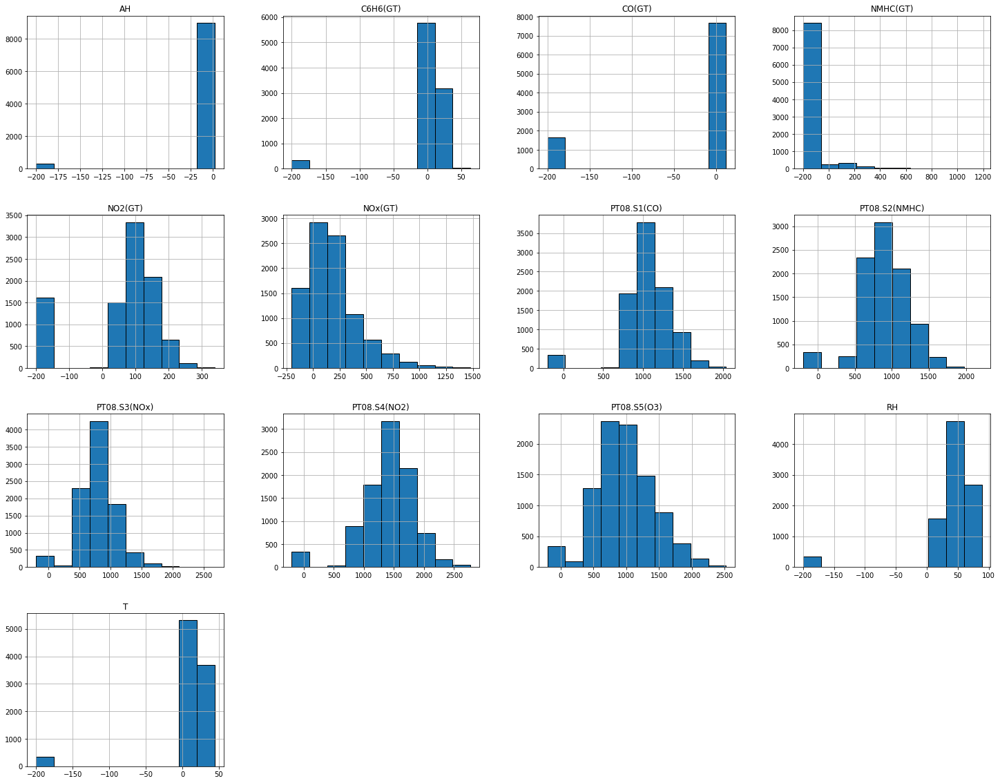

In [19]:
# Plot histogram grid
airq.hist(figsize=(25,20), xrot=0, edgecolor='black')  #First arg for extending the size horizontally
plt.show()

### Insight

###### 1.every columns is dramatically distributed between negative and positive values and having huge gap between particular range of negative values and positive values

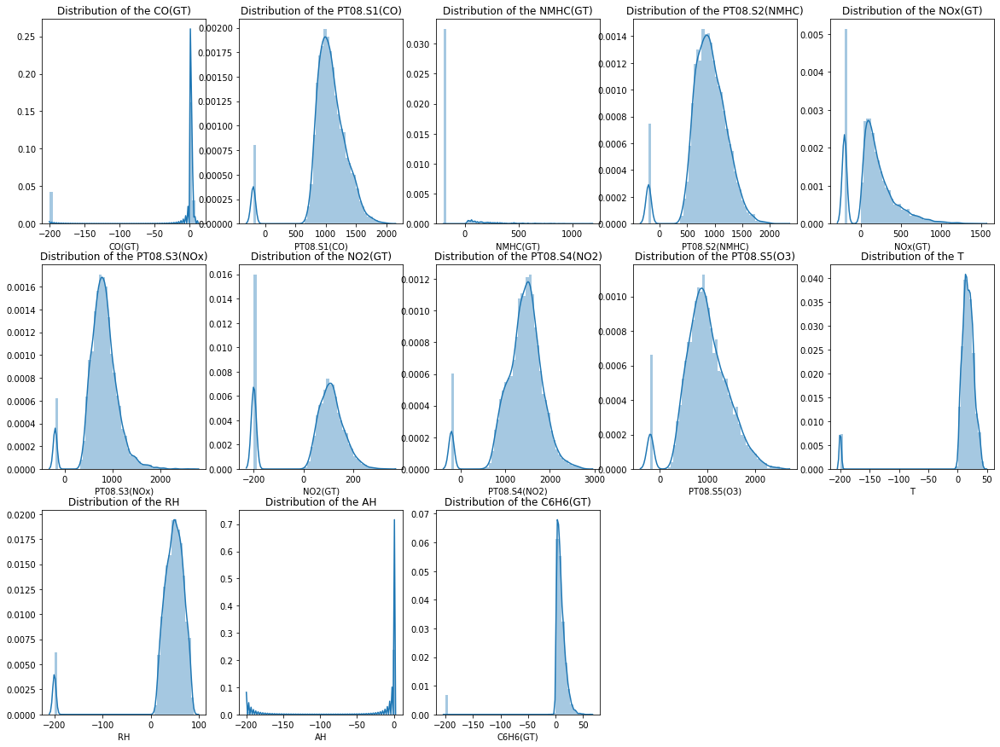

In [20]:
fig = plt.figure(figsize=(20,15))
for index,i in enumerate(airq.columns.tolist()) :#plotting distribution of every vaariale
    plt.subplot(3,5,index+1)
    sns.distplot(airq[i])
    plt.title("Distribution of the {}".format(i))

### Insight

#### 1.distribution for most of the variable is divided into two part due to particular range of negative values
#### 2.for positive part of distribution most of the variable are following normal distribution

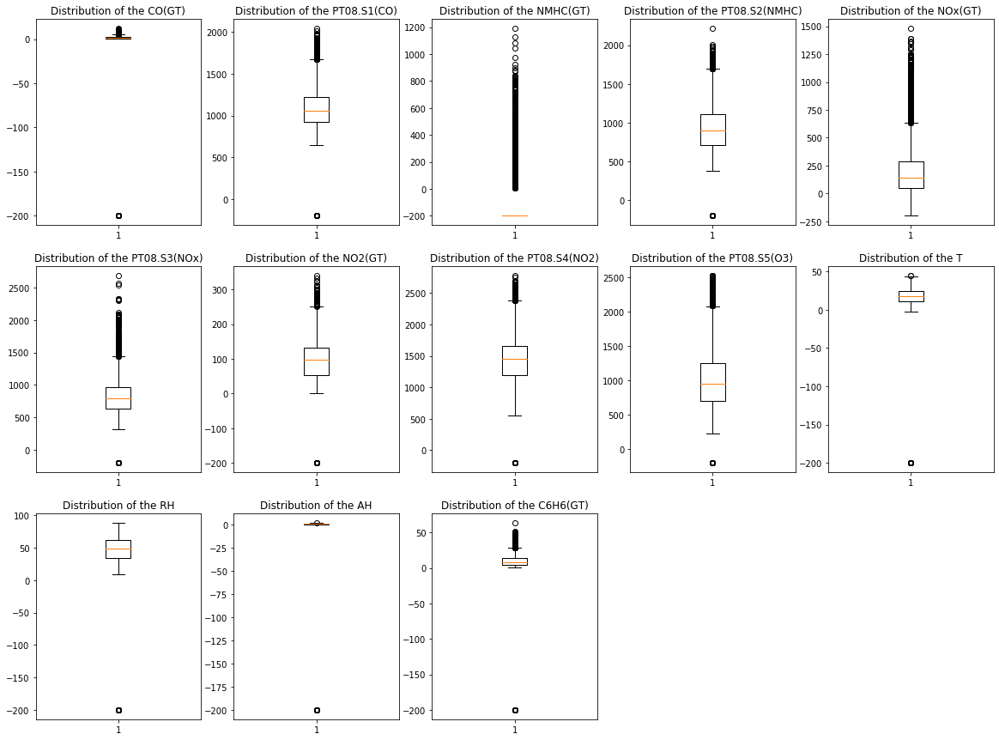

In [21]:
fig = plt.figure(figsize=(20,15))
for index,i in enumerate(airq.columns.tolist()) :
    plt.subplot(3,5,index+1)
    plt.boxplot(airq[i])
    plt.title("Distribution of the {}".format(i))

### Insight

#### 1.every column is containing too much outlier/anomaly

### Data preprocessing

In [22]:
## creating a function to check value percentage in the data set
def value_percent(dataframe_column,value):
    percent = (dataframe_column.shape[0]-dataframe_column[dataframe_column!=value].shape[0])*100/dataframe_column.shape[0]
    return percent

In [23]:
## creating a dataframe of percentage of -ve integer values for every column. min negative value in every column is -200(descriptive statistics)  
colmn = airq.columns.tolist()
val_percent = pd.DataFrame(columns = colmn)
for i in colmn:
    val_percent[i] = [value_percent(airq[i],a) for a in range(0,-201,-1)] 

In [24]:
val_percent.tail()#seeing bottom 5 rows of val_percent dataframe

,CO(GT),PT08.S1(CO),NMHC(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,C6H6(GT)
196,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
197,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
198,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
199,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
200,17.724641,3.592108,90.199442,3.592108,17.242119,3.592108,17.274287,3.592108,3.592108,3.592108,3.592108,3.592108,3.592108


In [25]:
val_percent = val_percent[(val_percent[colmn]>0)]##select values which are positive otherwise write Nan 
val_percent.dropna(inplace = True)                # dropping all nan values
val_percent.shape                                 # there is only one row corresponding to one negative value (-200) 

(1, 13)

### Insight

#### 1.there is only one negative value in the data set which is (-200).
#### 2. value(-200) is not following any pattern so that is anamoly 

In [26]:
#handling anamoly by selecting only positive values hence it replaces nan in the place of (-200) 
cols = airq.columns
airq2 = airq[airq[cols] > 0]

In [27]:
airq2.describe()#basic descriptive statistics about the new data

,CO(GT),PT08.S1(CO),NMHC(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,C6H6(GT)
count,7673.000000,8991.000000,914.000000,8991.000000,7718.000000,8991.000000,7715.000000,8991.000000,8991.000000,8977.000000,8991.000000,8991.000000,8991.000000
mean,2.152926,1099.707856,218.811816,939.126315,246.881252,835.370973,113.075515,1456.143486,1022.394592,18.345766,49.232360,1.026368,10.082993
std,1.453265,217.084571,204.459921,266.478251,212.971224,256.815106,48.359250,346.204540,397.783733,8.807613,17.316389,0.403508,7.449640
min,0.100000,647.250000,7.000000,383.250000,2.000000,322.000000,2.000000,551.000000,221.000000,0.050000,9.175000,0.184679,0.149048
25%,1.100000,936.750000,67.000000,735.250000,98.000000,657.875000,78.000000,1226.625000,732.500000,11.825000,35.812500,0.737830,4.436942
50%,1.800000,1063.000000,150.000000,908.250000,179.800000,805.500000,109.000000,1462.750000,964.000000,17.775000,49.550000,0.995395,8.239851
75%,2.900000,1231.250000,297.000000,1116.000000,326.000000,969.250000,142.000000,1673.500000,1272.125000,24.425000,62.500001,1.313701,13.988478
max,11.900000,2039.750000,1189.000000,2214.000000,1479.000000,2682.750000,339.700000,2775.000000,2522.750000,44.600000,88.725000,2.231036,63.741476


In [28]:
airq2.tail()# showing the bottom 5 rows of dataset

,CO(GT),PT08.S1(CO),NMHC(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,C6H6(GT)
9352,3.1,1314.25,NaN,1101.25,471.7,538.50,189.8,1374.25,1728.50,21.850,29.250,0.756824,13.529605
9353,2.4,1162.50,NaN,1027.00,353.3,603.75,179.2,1263.50,1269.00,24.325,23.725,0.711864,11.355157
9354,2.4,1142.00,NaN,1062.50,293.0,603.25,174.7,1240.75,1092.00,26.900,18.350,0.640649,12.374538
9355,2.1,1002.50,NaN,960.50,234.5,701.50,155.7,1041.00,769.75,28.325,13.550,0.513866,9.547187
9356,2.2,1070.75,NaN,1047.25,265.2,654.00,167.7,1128.50,816.00,28.500,13.125,0.502804,11.932060


In [29]:
airq2.isna().sum()#checking missing values in the new data set

CO(GT)           1653
PT08.S1(CO)       335
NMHC(GT)         8412
PT08.S2(NMHC)     335
NOx(GT)          1608
PT08.S3(NOx)      335
NO2(GT)          1611
PT08.S4(NO2)      335
PT08.S5(O3)       335
T                 349
RH                335
AH                335
C6H6(GT)          335
dtype: int64

In [30]:
## NMHC(GT) column contain missing values in more than 90% observations.so dropping NMHC column is the best solution
airq2.drop('NMHC(GT)',axis=1,inplace=True)    

In [31]:
# imputing other columns with mean values
for i in airq2.columns.tolist():
    airq2[i].fillna(airq2[i].mean(),inplace = True)

In [32]:
airq2.isna().sum()##checking missing values

CO(GT)           0
PT08.S1(CO)      0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
C6H6(GT)         0
dtype: int64

In [33]:
airq2.shape

(9326, 12)

## Outlier handling

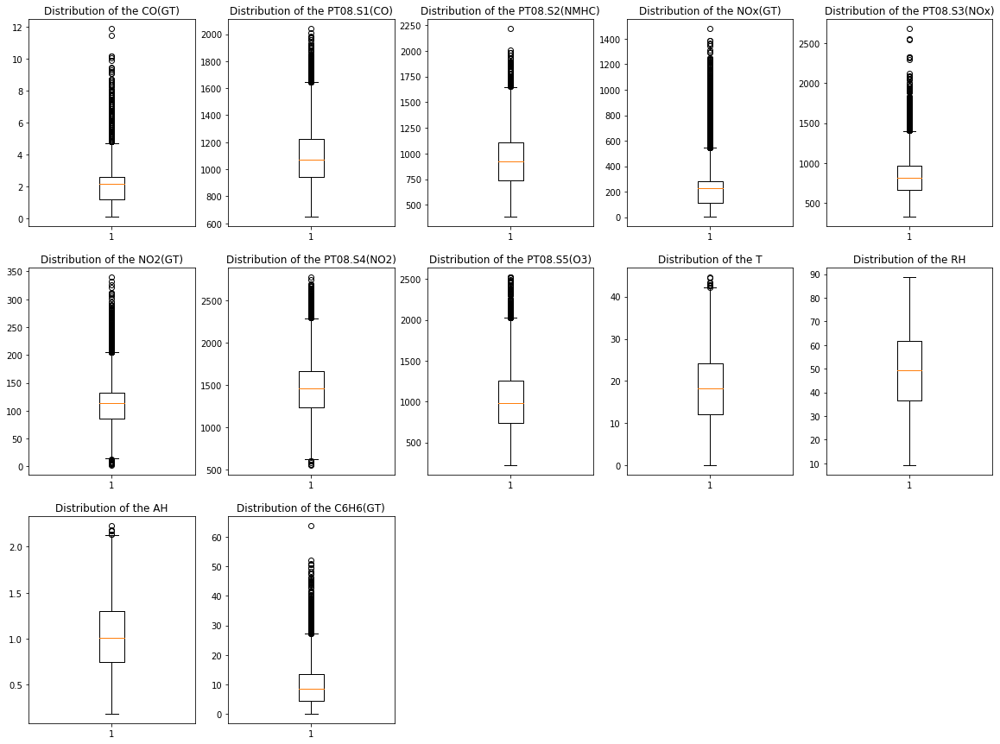

In [34]:
##plotting box plot to see amount of outliers
fig = plt.figure(figsize=(20,15))
for index,i in enumerate(airq2.columns.tolist()) :
    plt.subplot(3,5,index+1)
    plt.boxplot(airq2[i])
    plt.title("Distribution of the {}".format(i))

### Insight

#### 1.there are so much outliers are there (following pattern)

In [35]:
# making a function to remove outliers based on quartile range
def remove_outlier(data, col):
    q1 = data[col].quantile(0.25)
    q3 = data[col].quantile(0.75)
    iqr = q3-q1 #Interquartile range
    below_outlier  = q1-1.5*iqr
    above_outlier = q3+1.5*iqr
    data_final = data.loc[(data[col] > below_outlier) & (data[col] < above_outlier)]
    return data_final

In [36]:
#dataset after removing outliers
for i in airq2.columns.tolist():
    airq2 = remove_outlier(airq2,i)

In [37]:
airq2.shape##dimension of the data after removing outliers

(7291, 12)

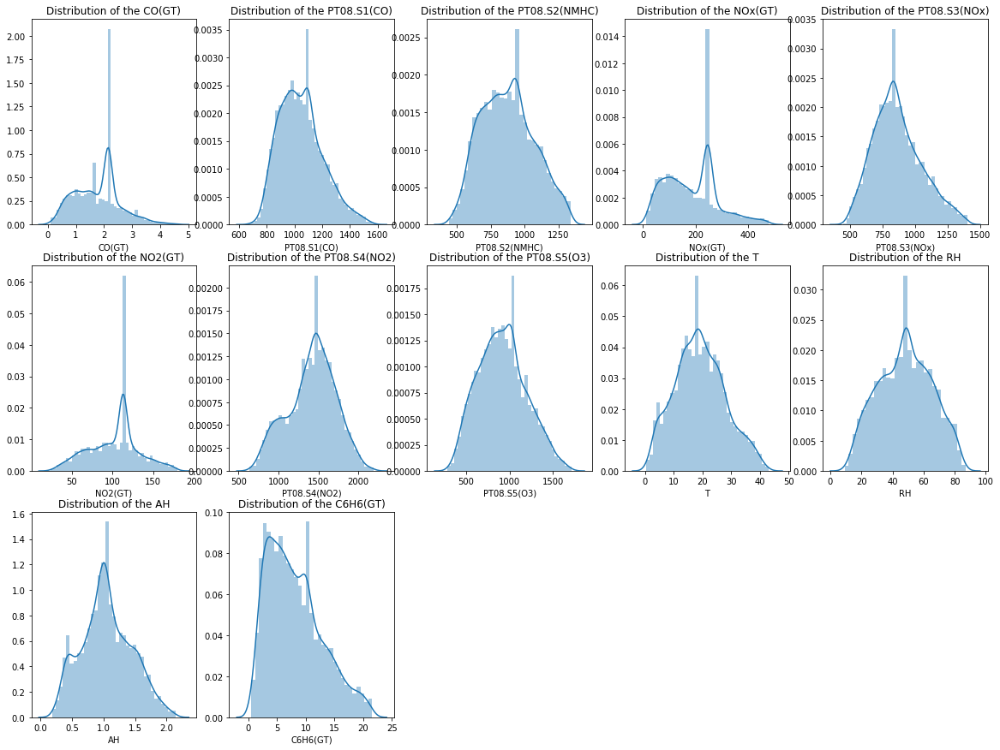

In [38]:
fig = plt.figure(figsize=(20,15))
for index,i in enumerate(airq2.columns.tolist()) :#plotting distribution of every vaariale
    plt.subplot(3,5,index+1)
    sns.distplot(airq2[i])
    plt.title("Distribution of the {}".format(i))

In [39]:
# all variables distribution is aproximately normal

#### Bivariate analysis

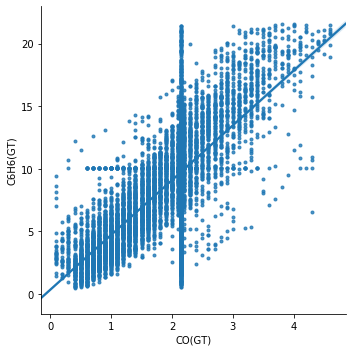

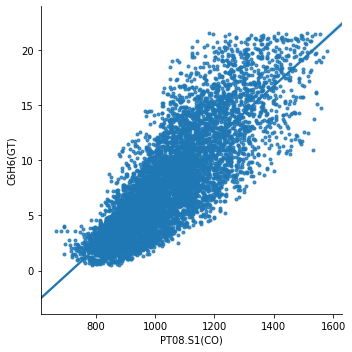

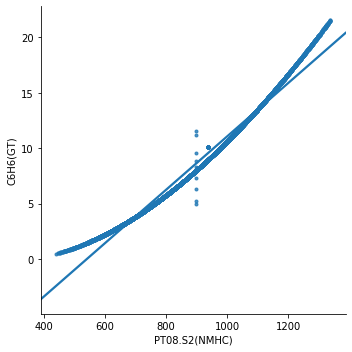

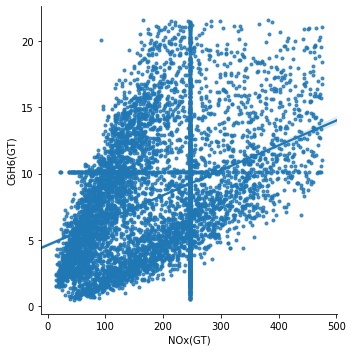

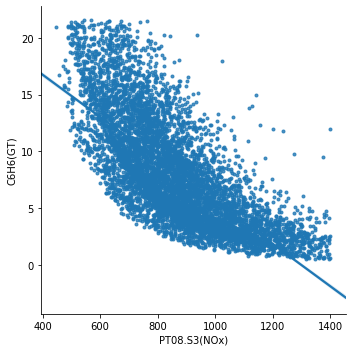

...

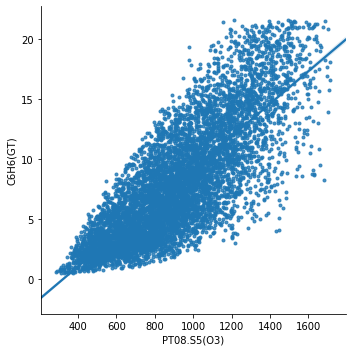

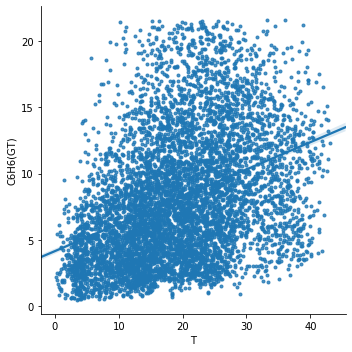

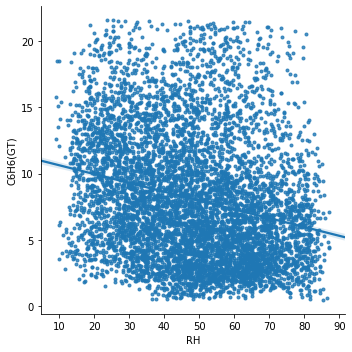

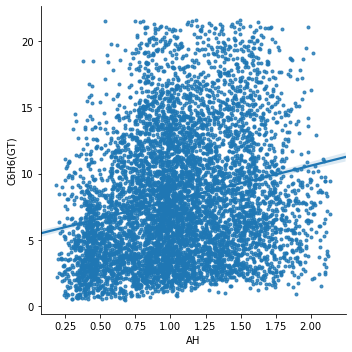

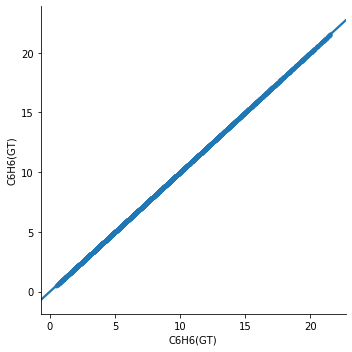

In [40]:
col=airq2.columns.tolist()
for i in col:
    sns.lmplot(x=i,y='C6H6(GT)',data=airq2,markers='.')

### Insight

#### 1.PT08.S2(NMHC) has maximum correlation with dependent variable
#### 2. PT08.S3(NOx) has negative correlation with dependent variable

<Figure size 3600x3240 with 0 Axes>

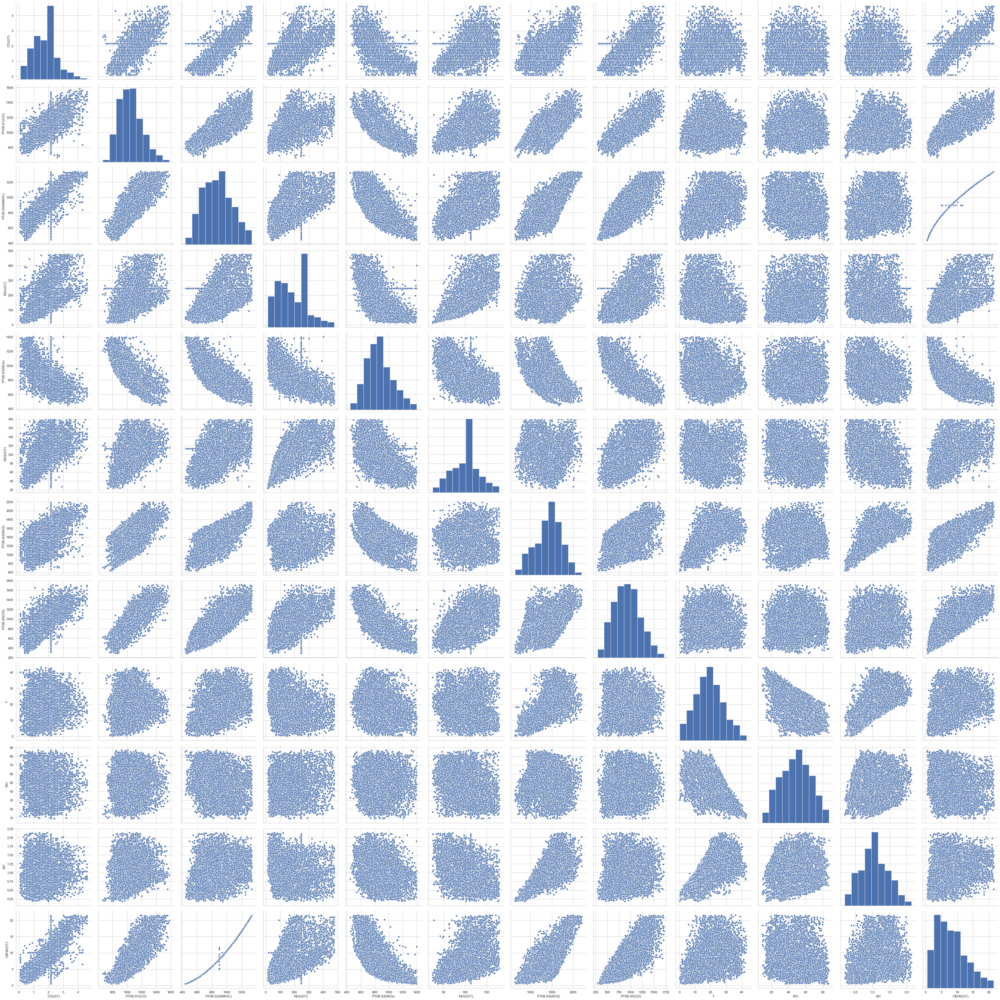

In [41]:
sns.set(style='whitegrid', context='notebook')
fig = plt.figure(figsize=(50,45))

sns.pairplot(airq2, height=4);
plt.tight_layout()
plt.show()

### Insight

#### 1.independent variables behaving same with PT08.S2(NMHC) as they are behaving with C6H6(GT)

In [42]:
cor = airq2.corr()
cor

,CO(GT),PT08.S1(CO),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,C6H6(GT)
CO(GT),1.000000,0.673133,0.742818,0.536167,-0.564573,0.533927,0.507134,0.635483,0.158155,-0.085456,0.098444,0.749657
PT08.S1(CO),0.673133,1.000000,0.820341,0.402426,-0.734832,0.435454,0.603873,0.824198,0.135159,0.027944,0.170934,0.817170
PT08.S2(NMHC),0.742818,0.820341,1.000000,0.399729,-0.765532,0.449497,0.743134,0.798897,0.400361,-0.252166,0.234704,0.989538
NOx(GT),0.536167,0.402426,0.399729,1.000000,-0.504359,0.715090,-0.022160,0.502363,-0.204915,0.142532,-0.125923,0.394917
PT08.S3(NOx),-0.564573,-0.734832,-0.765532,-0.504359,1.000000,-0.471005,-0.464856,-0.767170,-0.225901,-0.003400,-0.298337,-0.733849
NO2(GT),0.533927,0.435454,0.449497,0.715090,-0.471005,1.000000,0.007604,0.469288,-0.092888,-0.187135,-0.305388,0.437542
PT08.S4(NO2),0.507134,0.603873,0.743134,-0.022160,-0.464856,0.007604,1.000000,0.516495,0.648163,-0.106416,0.685206,0.737987
PT08.S5(O3),0.635483,0.824198,0.798897,0.502363,-0.767170,0.469288,0.516495,1.000000,0.039578,0.096634,0.133738,0.791588
T,0.158155,0.135159,0.400361,-0.204915,-0.225901,-0.092888,0.648163,0.039578,1.000000,-0.603027,0.635058,0.382265
RH,-0.085456,0.027944,-0.252166,0.142532,-0.003400,-0.187135,-0.106416,0.096634,-0.603027,1.000000,0.164430,-0.241998


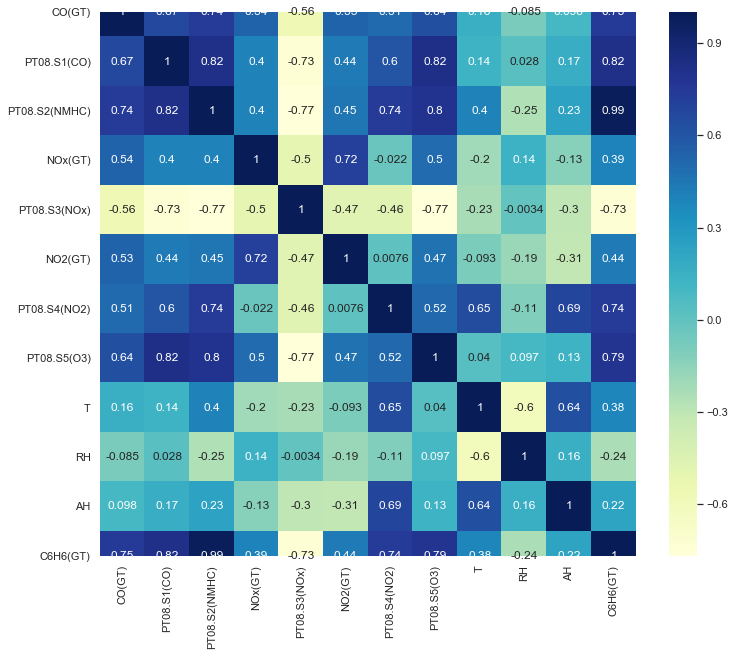

In [43]:
fig=plt.figure(figsize=(12,10))
sns.heatmap(cor,annot=True,cmap='YlGnBu')

### Insight

#### 1.PT08.S2(NMHC) is having maximum correlation with target variable of .9895
#### 2.independent variables are having amount of correlation so higher chances of multicollinearity

# checking VIF and selecting revalent features

In [44]:
#splitting target and other independent variables
y = airq2['C6H6(GT)']
x = airq2.drop('C6H6(GT)',axis = 1)

In [45]:
#function to find vif of columns
from statsmodels.stats.outliers_influence import variance_inflation_factor

def get_vif_factors(a):
    a_val = a.values
    vif = [variance_inflation_factor(a_val,i) for i in range(a_val.shape[1])]
    vif_factors = pd.DataFrame()
    vif_factors['column'] = a.columns
    vif_factors['VIF'] = vif
    return vif_factors

In [46]:
##dataframe is created which is having vif wrt there corresponding columns.first two columns represents column and their vif.
#next two columns represent columns and their vif and so on.
a = get_vif_factors(x.iloc[:,:2])
for i in range(3,12):
    a = pd.concat([a,get_vif_factors(x.iloc[:,:i])],axis=1)
a
        

,column,VIF,column,VIF,column,VIF,column,VIF,column,VIF,column,VIF,column,VIF,column,VIF,column,VIF,column,VIF
0,CO(GT),8.825012,CO(GT),11.729212,CO(GT),13.754811,CO(GT),14.560570,CO(GT),14.645208,CO(GT),14.861900,CO(GT),14.893756,CO(GT),15.558391,CO(GT),16.388149,CO(GT),16.417522
1,PT08.S1(CO),8.825012,PT08.S1(CO),63.653048,PT08.S1(CO),65.669479,PT08.S1(CO),108.946075,PT08.S1(CO),110.365983,PT08.S1(CO),113.954836,PT08.S1(CO),151.348739,PT08.S1(CO),158.567827,PT08.S1(CO),183.148068,PT08.S1(CO),183.659825
2,NaN,NaN,PT08.S2(NMHC),82.496780,PT08.S2(NMHC),82.746460,PT08.S2(NMHC),87.522738,PT08.S2(NMHC),88.482821,PT08.S2(NMHC),149.092291,PT08.S2(NMHC),158.398248,PT08.S2(NMHC),173.292694,PT08.S2(NMHC),226.980007,PT08.S2(NMHC),262.311045
3,NaN,NaN,NaN,NaN,NOx(GT),6.331488,NOx(GT),6.425424,NOx(GT),10.326149,NOx(GT),10.995445,NOx(GT),11.450096,NOx(GT),11.506719,NOx(GT),15.398034,NOx(GT),16.071050
4,NaN,NaN,NaN,NaN,NaN,NaN,PT08.S3(NOx),12.135854,PT08.S3(NOx),12.729138,PT08.S3(NOx),14.979511,PT08.S3(NOx),18.350460,PT08.S3(NOx),18.898156,PT08.S3(NOx),20.542622,PT08.S3(NOx),29.972184
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NO2(GT),26.211015,NO2(GT),29.453569,NO2(GT),29.539843,NO2(GT),30.456654,NO2(GT),32.497797,NO2(GT),33.489151
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PT08.S4(NO2),83.223462,PT08.S4(NO2),83.445926,PT08.S4(NO2),123.000002,PT08.S4(NO2),202.354114,PT08.S4(NO2),249.855093
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PT08.S5(O3),52.186197,PT08.S5(O3),61.531853,PT08.S5(O3),62.172791,PT08.S5(O3),62.189646
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,T,15.593243,T,26.722357,T,72.200186
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,RH,28.494981,RH,63.094591


In [47]:
a.describe()

,VIF,VIF,VIF,VIF,VIF,VIF,VIF,VIF,VIF,VIF
count,2.000000e+00,3.000000,4.000000,5.000000,6.000000,7.000000,8.000000,9.000000,10.000000,11.000000
mean,8.825012e+00,52.626346,42.125559,45.918132,43.793386,59.508716,64.951658,67.600615,81.469892,97.712467
std,6.404746e-15,36.649738,37.817494,48.445015,43.983760,55.953885,60.350873,66.014259,86.289032,91.034612
min,8.825012e+00,11.729212,6.331488,6.425424,10.326149,10.995445,11.450096,11.506719,15.398034,16.071050
25%,8.825012e+00,37.691130,11.898980,12.135854,13.208156,14.920706,17.486284,15.593243,22.087556,31.730668
50%,8.825012e+00,63.653048,39.712145,14.560570,20.428112,29.453569,40.863020,30.456654,30.496389,63.094591
75%,8.825012e+00,73.074914,69.938724,87.522738,72.914869,98.589149,100.421629,123.000002,152.904248,134.618337
max,8.825012e+00,82.496780,82.746460,108.946075,110.365983,149.092291,158.398248,173.292694,226.980007,262.311045


### Insight

#### 1.for any combination of columns vif is not less than 6. high multicollinearity
#### 2.hence we are selecting relevant features which is having high correlation with dependent variable and low correlation with independent variable
#### 3. so first we are selecting PT08.S2(NMHC)(98.95% correlation with dependent variable)


In [48]:
##doing forward feature selection based on VIF
for i in x.columns.tolist():
    b = x[['PT08.S2(NMHC)',i]]
    print(get_vif_factors(b))

          column        VIF
0  PT08.S2(NMHC)  11.437552
1         CO(GT)  11.437552
          column        VIF
0  PT08.S2(NMHC)  62.070244
1    PT08.S1(CO)  62.070244
          column  VIF
0  PT08.S2(NMHC)  inf
1  PT08.S2(NMHC)  inf
          column      VIF
0  PT08.S2(NMHC)  5.34003
1        NOx(GT)  5.34003
          column       VIF
0  PT08.S2(NMHC)  6.533911
1   PT08.S3(NOx)  6.533911
          column        VIF
0  PT08.S2(NMHC)  13.687265
1        NO2(GT)  13.687265
          column        VIF
0  PT08.S2(NMHC)  43.966125
1   PT08.S4(NO2)  43.966125
          column        VIF
0  PT08.S2(NMHC)  33.326602
1    PT08.S5(O3)  33.326602
          column       VIF
0  PT08.S2(NMHC)  6.825417
1              T  6.825417
          column       VIF
0  PT08.S2(NMHC)  5.376699
1             RH  5.376699
          column       VIF
0  PT08.S2(NMHC)  7.545156
1             AH  7.545156


c:\users\ishwa\appdata\local\programs\python\python36\lib\site-packages\statsmodels\stats\outliers_influence.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


### Insight

#### 1.there is only 2 independent variable which is having vif <6 .hence we are taking "RH" and NOx(GT) also in consideration

In [49]:
#splitting the dataset into train and test
X_train, X_test, y_train, y_test  = train_test_split(x, y,
                                                     test_size = 0.3,
                                                     random_state = 1234) 

In [50]:
col = ['PT08.S2(NMHC)','RH','NOx(GT)']

In [51]:
X_train = X_train[col]
X_test = X_test[col]
airq2_ols_selected = sm.OLS(y_train,X_train).fit()
airq2_ols_selected.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                        Results: Ordinary least squares
================================================================================
Model:                  OLS              Adj. R-squared (uncentered): 0.945     
Dependent Variable:     C6H6(GT)         AIC:                         22445.8316
Date:                   2019-11-26 23:31 BIC:                         22465.4444
No. Observations:       5103             Log-Likelihood:              -11220.   
Df Model:               3                F-statistic:                 2.905e+04 
Df Residuals:           5100             Prob (F-statistic):          0.00      
R-squared (uncentered): 0.945            Scale:                       4.7593    
-----------------------------------------------------------------------------------
                     Coef.     Std.Err.       t        P>|t|      [0.025     0.975]
-----------------------------------------------------------------------------------
PT08.S2(NMHC)        0.0135      0.0001    138.1695    0.0000     0.0133     0.0136
RH                  -0.0866      0.0014    -61.4880    0.0000    -0.0893    -0.0838
NOx(GT)              0.0042      0.0003     12.3336    0.0000     0.0036     0.0049
--------------------------------------------------------------------------------
Omnibus:                   468.830           Durbin-Watson:              1.945  
Prob(Omnibus):             0.000             Jarque-Bera (JB):           655.328
Skew:                      0.739             Prob(JB):                   0.000  
Kurtosis:                  3.947             Condition No.:              42     
================================================================================

"""

In [52]:
## ols model is giving 94.5 % accuracy and based on p-values,selected features are relevant

## Residual analysis in multiple linear regression

### Test for normality of residuals(P-P Plot)

In [53]:
def draw_PP_plot(model,title):
    probplot = sm.ProbPlot(model.resid)
    plt.figure(figsize = (12,10))
    probplot.ppplot(line = '45')
    plt.title(title)
    plt.show()

<Figure size 864x720 with 0 Axes>

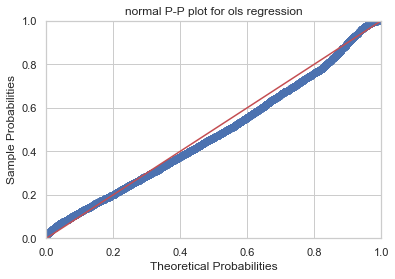

In [54]:
draw_PP_plot(airq2_ols_selected,'normal P-P plot for ols regression')

In [55]:
## residual are is following normal distribution hence the model is robust

#### MLR model

In [56]:
from sklearn.metrics import r2_score
regressor = LinearRegression()
regressor.fit(X_train, y_train)
y_predictions = regressor.predict(X_test)
print('R-squared:', regressor.score(X_test, y_test))##r2 for test
#r2_score(y_test, y_predictions) 

R-squared: 0.9798079074616927


In [57]:
regressor.coef_

array([ 2.40632155e-02,  1.82505417e-03, -1.87044701e-05])

### CART model

In [58]:
from sklearn.tree import DecisionTreeRegressor

tree = DecisionTreeRegressor(max_depth=3)
tree.fit(X_train, y_train)

y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)

print('MSE train: %.3f, test: %.3f' % (mean_squared_error(y_train, y_train_pred),mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (r2_score(y_train, y_train_pred),r2_score(y_test, y_test_pred)))

MSE train: 0.471, test: 0.455
R^2 train: 0.978, test: 0.980


### Random forest model

In [59]:
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor(n_estimators=1000, criterion='mse', random_state=1, n_jobs=-1)
forest.fit(X_train, y_train)
y_train_pred = forest.predict(X_train)
y_test_pred = forest.predict(X_test)

print('MSE train: %.3f, test: %.3f' % (mean_squared_error(y_train, y_train_pred),mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (r2_score(y_train, y_train_pred),r2_score(y_test, y_test_pred)))

MSE train: 0.001, test: 0.002
R^2 train: 1.000, test: 1.000


### Model Selection 

In [60]:
from sklearn import metrics
#takes a model as a parameter
#prints the MSE and r_square on train and test set
model_data= list()
def get_train_test_report(model_name,model,x,y):
    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)
    model.fit(X_train,y_train)
    #predicting on training dataset
    y_train_pred = model.predict(X_train)
    r2_train=r2_score(y_train,y_train_pred)
    mse_train = mean_squared_error(y_train, y_train_pred)
    #predicting on test dataset
    y_test_predict = model.predict(X_test)
    r2_test=r2_score(y_test,y_test_predict)
    mse_test = mean_squared_error(y_test, y_test_predict)
    model_data.append(tuple([model_name,mse_train,r2_train,mse_test,r2_test]))
    model_details1=pd.DataFrame(model_data,columns=['ModelName','train mse','R^2 train','test mse','R^2 test'])
    print(model_details1)
    return

In [61]:
model_names = ['LinearRegression','DecisionTreeRegressor']
model_list = [LinearRegression(),DecisionTreeRegressor(max_depth=3)]
for index,model in enumerate(model_list):
    get_train_test_report(model_names[index],model,x,y)

          ModelName  train mse  R^2 train  test mse  R^2 test
0  LinearRegression   0.402553    0.98173  0.402703  0.981875
               ModelName  train mse  R^2 train  test mse  R^2 test
0       LinearRegression   0.402553    0.98173  0.402703  0.981875
1  DecisionTreeRegressor   0.465341    0.97888  0.470563  0.978821


## Ridge and Lasso regression

In [62]:
from sklearn.linear_model import Ridge
ridge = Ridge(alpha = 1,max_iter = 500)
ridge.fit(X_train,y_train)
y_train_pred = ridge.predict(X_train)
y_test_pred = ridge.predict(X_test)

print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

MSE train: 0.461, test: 0.453
R^2 train: 0.979, test: 0.980


In [63]:
ridge.coef_

array([ 2.40632153e-02,  1.82505213e-03, -1.87042495e-05])

In [64]:
from sklearn.linear_model import Lasso
lasso = Lasso(alpha = 1,max_iter = 500)
lasso.fit(X_train,y_train)
y_train_pred = lasso.predict(X_train)
y_test_pred = lasso.predict(X_test)

print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

MSE train: 0.462, test: 0.456
R^2 train: 0.979, test: 0.980


In [65]:
lasso_coef = pd.DataFrame({"columns":X_train.columns,'coef':lasso.coef_})

In [66]:
lasso_coef

,columns,coef
0,PT08.S2(NMHC),0.02399
1,RH,0.00000
2,NOx(GT),0.00000
